In [1]:
import torch
import torch.nn as nn
from torchvision.datasets import MNIST
from torchvision.transforms import transforms
import numpy as np

#import F
from torch.nn import functional as F

In [2]:
# Set device to cuda 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

Device: cuda


In [3]:
image_transform = transforms.Compose([transforms.Resize((128,128)),
    transforms.ToTensor(),transforms.Normalize([0.5], [0.5]),transforms.Lambda(lambda x : x.to(device))
])

In [4]:
from torchvision import datasets

In [5]:
trainFolder = '../train'
trainDataset = datasets.ImageFolder(trainFolder, transform=image_transform)

# Select 1000 images only to train
#trainDataset = torch.utils.data.Subset(trainDataset, np.random.choice(len(trainDataset), 1000, replace=False))

validFolder = '../val'
validDataset = datasets.ImageFolder(validFolder, transform=image_transform)

# Select 100 images only to validate
#validDataset = torch.utils.data.Subset(validDataset, np.random.choice(len(validDataset), 100, replace=False))

In [6]:
print('Train dataset:', len(trainDataset))
print('Valid dataset:', len(validDataset))

Train dataset: 5153
Valid dataset: 500


In [7]:
#Import DataLoader
from torch.utils.data import DataLoader
batchSize = 64
trainLoader = DataLoader(trainDataset, batch_size=batchSize, shuffle=True)
validLoader = DataLoader(validDataset, batch_size=batchSize, shuffle=True) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


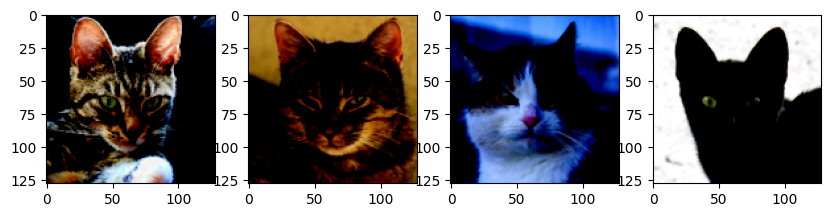

In [8]:
# print some images from the trainLoader
import matplotlib.pyplot as plt
import numpy as np
for images, labels in trainLoader:
    fig, axes = plt.subplots(figsize=(10,4), ncols=4)
    for i in range(4):
        ax = axes[i]
        ax.imshow(images[i].cpu().numpy().transpose(1,2,0).squeeze())
    break

In [9]:
class VariationalAutoEncoder(nn.Module):
    
    def __init__(self):
        super(VariationalAutoEncoder, self).__init__()
        
        # Make encoder to accept 128x128 images across 3 channels
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3, stride=2, padding=1), # 64x64
            nn.BatchNorm2d(8),
            nn.ReLU(),
            
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3, stride=2, padding=1), # 32x32
            nn.BatchNorm2d(16),
            nn.ReLU(),
            
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=2, padding=1), # 16x16
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1), # 8x8
            nn.BatchNorm2d(64),
            nn.ReLU(),
            
            nn.Flatten(),
            nn.Linear(64*8*8, 64*4*4),
            nn.ReLU(),
            nn.Linear(64*4*4, 256),
            
        )
        
        # mean and log variance
        self.mean = nn.Linear(256, 128)
        self.logvar = nn.Linear(256, 128)
        
        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, 64*8*8),
            nn.ReLU(),
            nn.Unflatten(1, (64, 8, 8)),
            
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1), # 16x16
            nn.BatchNorm2d(32),
            nn.ReLU(),
            
            nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=3, stride=2, padding=1, output_padding=1), # 32x32
            nn.BatchNorm2d(16),
            nn.ReLU(),
            
            nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=3, stride=2, padding=1, output_padding=1), # 64x64
            nn.BatchNorm2d(8),
            nn.ReLU(),
            
            nn.ConvTranspose2d(in_channels=8, out_channels=3, kernel_size=3, stride=2, padding=1, output_padding=1), # 128x128
            nn.Tanh()
        )
        
    def reparameterize(self, mean, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mean + eps*std
    
    def forward(self, x):
        x = self.encoder(x)
        mean = self.mean(x)
        logvar = self.logvar(x)
        z = self.reparameterize(mean, logvar)
        x = self.decoder(z)
        return x, mean, logvar

In [10]:
from torchsummary import summary
model = VariationalAutoEncoder().to(device)
summary(model, (3, 128, 128))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 256]                 --
|    └─Conv2d: 2-1                       [-1, 8, 64, 64]           224
|    └─BatchNorm2d: 2-2                  [-1, 8, 64, 64]           16
|    └─ReLU: 2-3                         [-1, 8, 64, 64]           --
|    └─Conv2d: 2-4                       [-1, 16, 32, 32]          1,168
|    └─BatchNorm2d: 2-5                  [-1, 16, 32, 32]          32
|    └─ReLU: 2-6                         [-1, 16, 32, 32]          --
|    └─Conv2d: 2-7                       [-1, 32, 16, 16]          4,640
|    └─BatchNorm2d: 2-8                  [-1, 32, 16, 16]          64
|    └─ReLU: 2-9                         [-1, 32, 16, 16]          --
|    └─Conv2d: 2-10                      [-1, 64, 8, 8]            18,496
|    └─BatchNorm2d: 2-11                 [-1, 64, 8, 8]            128
|    └─ReLU: 2-12                        [-1, 64, 8, 8]            --
|  

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 256]                 --
|    └─Conv2d: 2-1                       [-1, 8, 64, 64]           224
|    └─BatchNorm2d: 2-2                  [-1, 8, 64, 64]           16
|    └─ReLU: 2-3                         [-1, 8, 64, 64]           --
|    └─Conv2d: 2-4                       [-1, 16, 32, 32]          1,168
|    └─BatchNorm2d: 2-5                  [-1, 16, 32, 32]          32
|    └─ReLU: 2-6                         [-1, 16, 32, 32]          --
|    └─Conv2d: 2-7                       [-1, 32, 16, 16]          4,640
|    └─BatchNorm2d: 2-8                  [-1, 32, 16, 16]          64
|    └─ReLU: 2-9                         [-1, 32, 16, 16]          --
|    └─Conv2d: 2-10                      [-1, 64, 8, 8]            18,496
|    └─BatchNorm2d: 2-11                 [-1, 64, 8, 8]            128
|    └─ReLU: 2-12                        [-1, 64, 8, 8]            --
|  

In [11]:
def lossFunction(reconX, X, mean, logVariance):
    mseLoss = F.mse_loss(reconX, X, reduction='sum')
    KLdivergenceLoss = torch.mean(-0.5 * torch.sum(1 + logVariance - mean.pow(2) - logVariance.exp(), dim = 1), dim = 0)
    return [mseLoss + 1*KLdivergenceLoss, mseLoss, 1*KLdivergenceLoss]

In [12]:
# Initialize optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [13]:
trainLosses = []
validLosses = []

trainMSELosses = []
validMSELosses = []

trainKLDivergences = []
validKLDivergences = []

EPOCH: 1.000  trainMSELoss: 724857.857  validMSELoss: 533178.295  validKLdivergenceLoss: 1055.968  trainKLdivergenceLoss: 445189.220  trainLoss: 1170047.063  validLoss: 534234.268  (11.25s - 33.74s remaining)


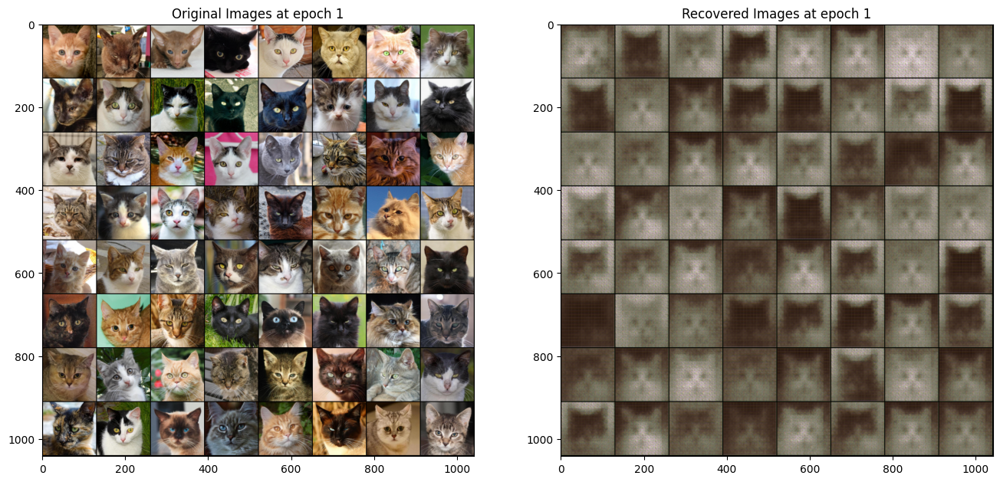

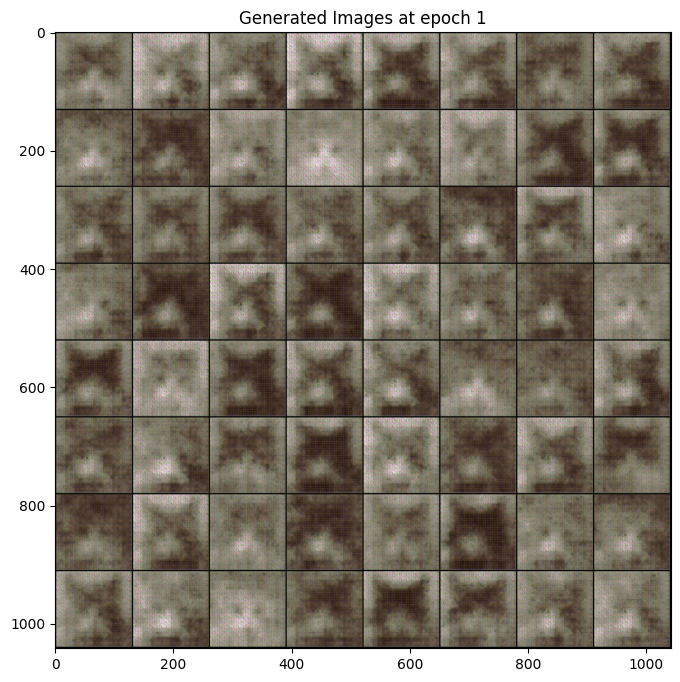

EPOCH: 2.000  trainMSELoss: 464058.139  validMSELoss: 409378.215  validKLdivergenceLoss: 1196.112  trainKLdivergenceLoss: 1174.957  trainLoss: 465233.097  validLoss: 410574.324  (23.58s - 23.58s remaining)


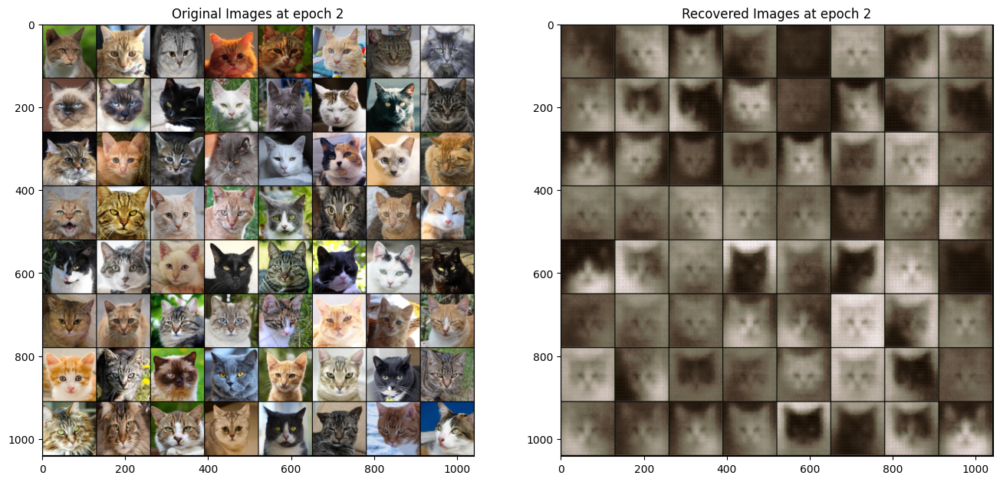

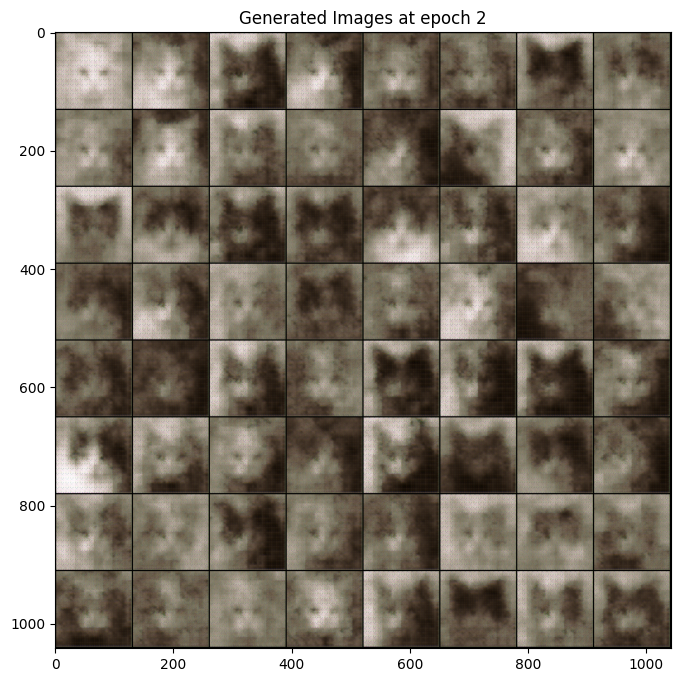

EPOCH: 3.000  trainMSELoss: 408871.724  validMSELoss: 382262.090  validKLdivergenceLoss: 918.265  trainKLdivergenceLoss: 999.179  trainLoss: 409870.904  validLoss: 383180.355  (37.20s - 12.40s remaining)


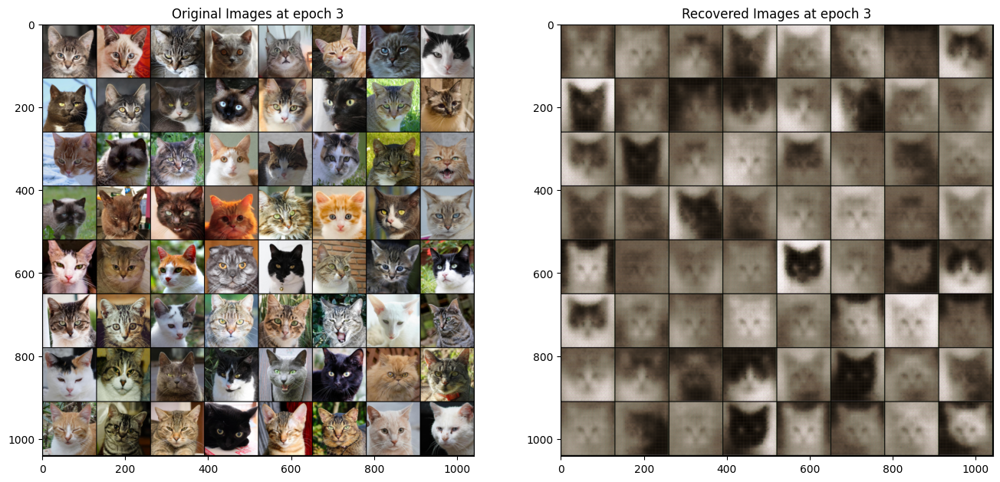

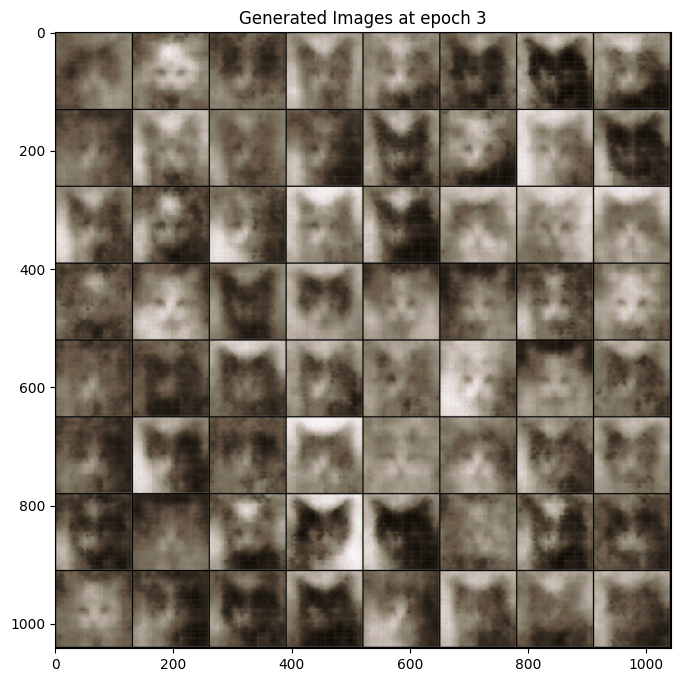

EPOCH: 4.000  trainMSELoss: 380112.884  validMSELoss: 361447.520  validKLdivergenceLoss: 885.793  trainKLdivergenceLoss: 878.511  trainLoss: 380991.396  validLoss: 362333.309  (50.16s - 0.00s remaining)


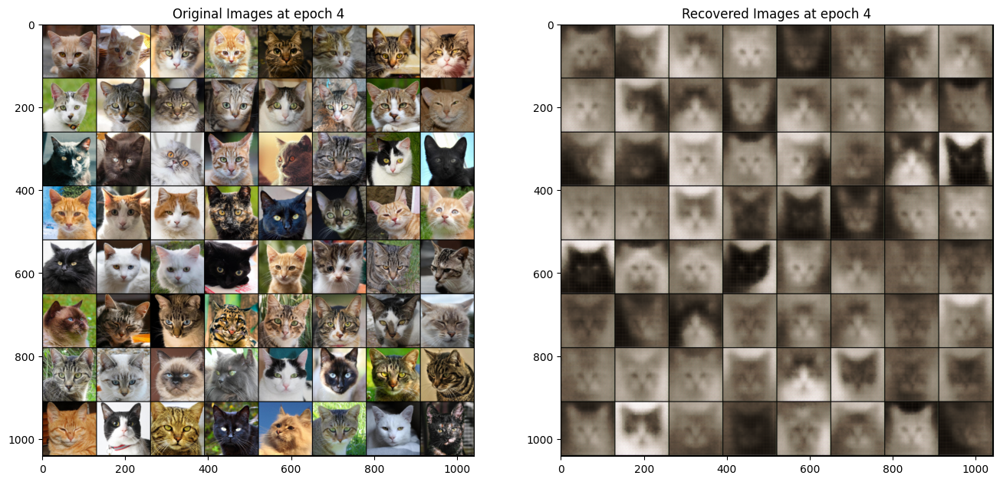

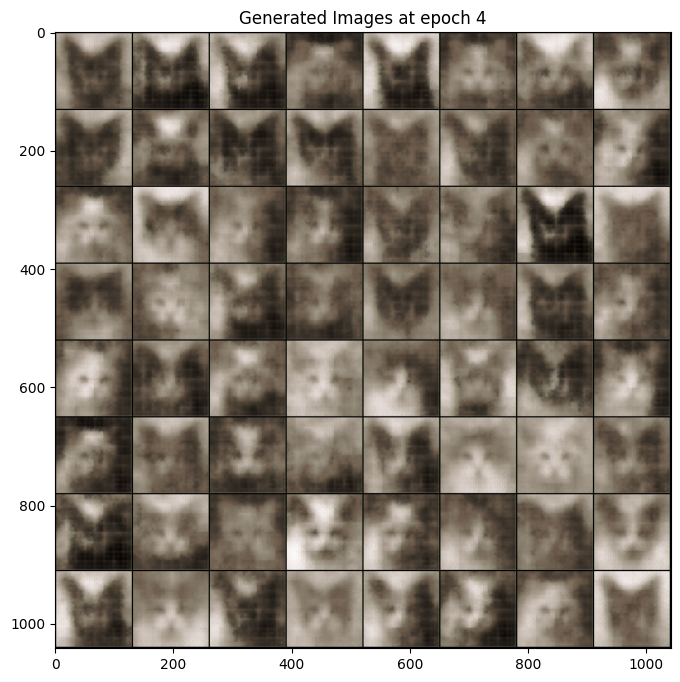

In [14]:
# training Loop
from torch_snippets import *
from torchvision.utils import make_grid

numEpochs = 40
log = Report(numEpochs)

for epoch in range(numEpochs):
    N = len(trainLoader)
    
    trainL = 0
    trainMSEL = 0
    trainKLD = 0
    for batchIndex, (imageSet, labelSet) in enumerate(trainLoader):
        imageSet = imageSet.to(device)
        
        optimizer.zero_grad()
        reconImageSet, mean, logvar = model(imageSet)
        loss, mseLoss, KLdivergenceLoss = lossFunction(reconImageSet, imageSet, mean, logvar)
        
        
        # Backpropagation on MSE + KL divergence loss
        loss.backward()
        optimizer.step()
        
        # Logging
        log.record(epoch+(batchIndex+1)/N, trainLoss=loss, trainMSELoss=mseLoss, trainKLdivergenceLoss=KLdivergenceLoss, end='\r')
        
        trainL += loss.item()
        trainMSEL += mseLoss.item()
        trainKLD += KLdivergenceLoss.item()
    
    trainLosses.append(trainL)
    trainMSELosses.append(trainMSEL)
    trainKLDivergences.append(trainKLD)
        
    # Validation
    N = len(validLoader)
    
    validL = 0
    validMSEL = 0
    validKLD = 0
    
    for batchIndex, (imageSet, labelSet) in enumerate(validLoader):
        imageSet = imageSet.to(device)
        
        reconImageSet, mean, logvar = model(imageSet)
        lossV, mseLossV, KLdivergenceLossV = lossFunction(reconImageSet, imageSet, mean, logvar)
        
        # Logging
        log.record(epoch+(batchIndex+1)/N, validLoss=lossV, validMSELoss=mseLossV, validKLdivergenceLoss=KLdivergenceLossV, end='\r')
        
        validL += lossV.item()
        validMSEL += mseLossV.item()
        validKLD += KLdivergenceLossV.item()
        
    validLosses.append(validL)
    validMSELosses.append(validMSEL)
    validKLDivergences.append(validKLD)
        
    log.report_avgs(epoch+1)
    
    # PLot the reconstructed images
    with torch.no_grad():
        imageSet = next(iter(validLoader))[0].to(device)
        reconImageSet, _, _ = model(imageSet)
        imageSet = make_grid(imageSet, nrow=8, normalize=True)
        reconImageSet = make_grid(reconImageSet, nrow=8, normalize=True)
        plt.figure(figsize=(16,8))
        plt.subplot(1,2,1)
        plt.imshow(imageSet.cpu().numpy().transpose(1,2,0))
        plt.title(f"Original Images at epoch {epoch+1}")
        plt.subplot(1,2,2)
        plt.imshow(reconImageSet.cpu().numpy().transpose(1,2,0))
        plt.title(f"Recovered Images at epoch {epoch+1}")
        
        plt.show()
        
    #Generate new images0.000
    with torch.no_grad():
        z = torch.randn(64, 128).to(device)
        newImageSet = model.decoder(z)
        newImageSet = make_grid(newImageSet, nrow=8, normalize=True)
        plt.figure(figsize=(8,8))
        plt.imshow(newImageSet.cpu().numpy().transpose(1,2,0))
        plt.title(f"Generated Images at epoch {epoch+1}")
        plt.show()

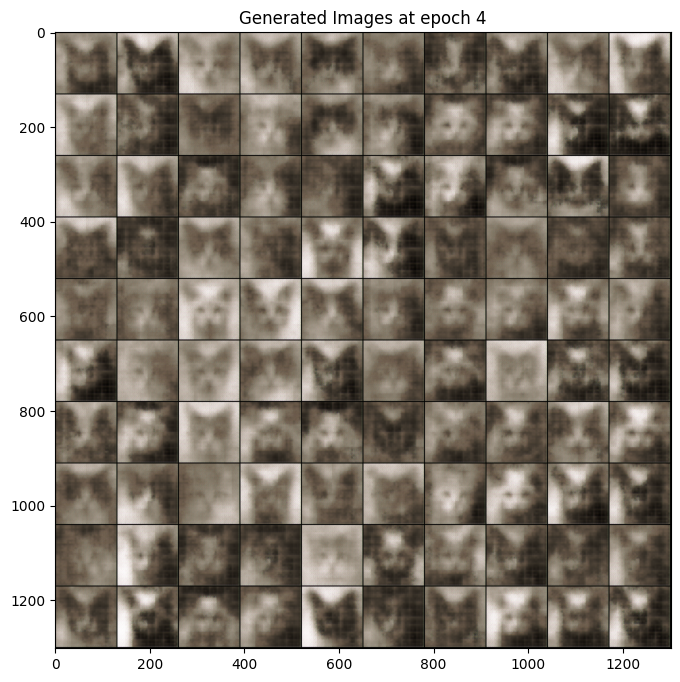

In [15]:
with torch.no_grad():
    z = torch.randn(100, 128).to(device)
    newImageSet = model.decoder(z)
    newImageSet = make_grid(newImageSet, nrow=10, normalize=True)
    plt.figure(figsize=(8,8))
    plt.imshow(newImageSet.cpu().numpy().transpose(1,2,0))
    plt.title(f"Generated Images at epoch {epoch+1}")
    plt.show()

100%|██████████| 105/105 [00:00<00:00, 37436.41it/s]


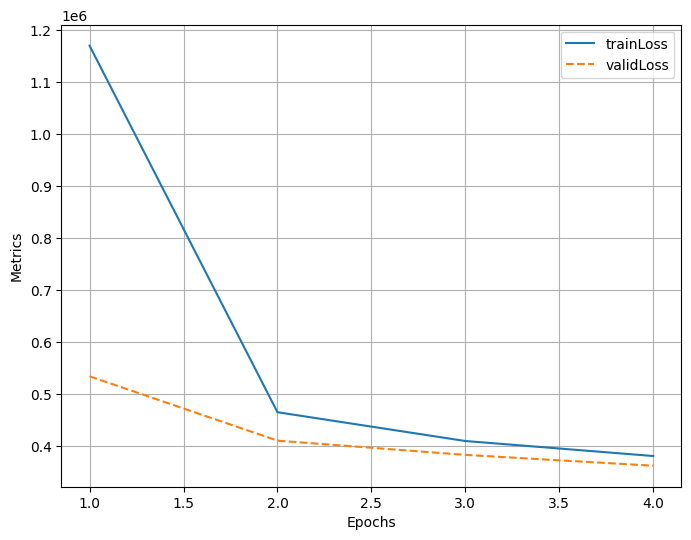

In [16]:
# plot the loss
log.plot_epochs(['trainLoss', 'validLoss'])


100%|██████████| 105/105 [00:00<00:00, 42407.50it/s]


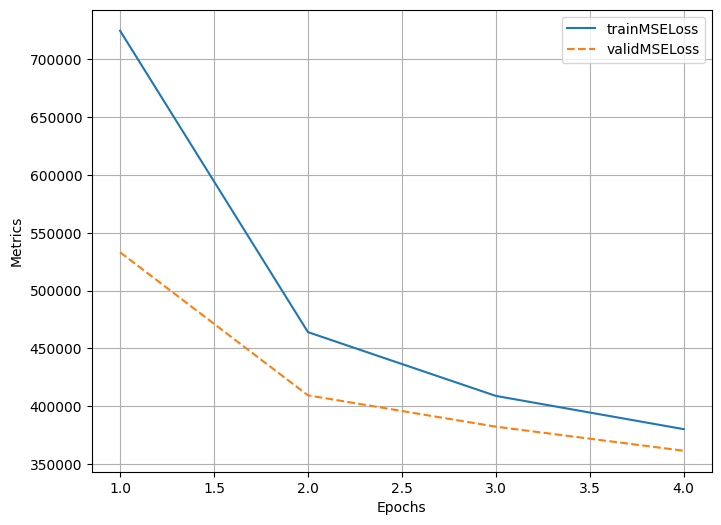

In [17]:
# plot the MSE loss
log.plot_epochs(['trainMSELoss', 'validMSELoss'])

100%|██████████| 105/105 [00:00<00:00, 142110.98it/s]


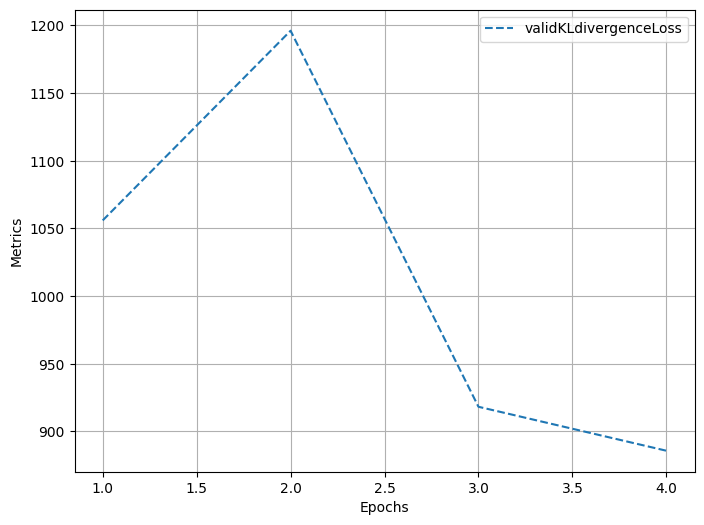

In [18]:
#plot valid KL divergence loss
log.plot_epochs(['validKLdivergenceLoss'])

100%|██████████| 105/105 [00:00<00:00, 24114.43it/s]


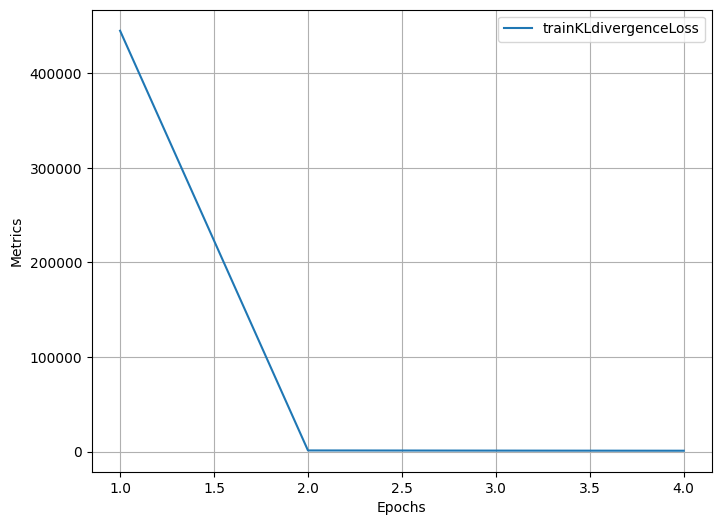

In [19]:
# plot train KL divergence loss
log.plot_epochs(['trainKLdivergenceLoss'], start = 2)

100%|██████████| 105/105 [00:00<00:00, 38580.98it/s]


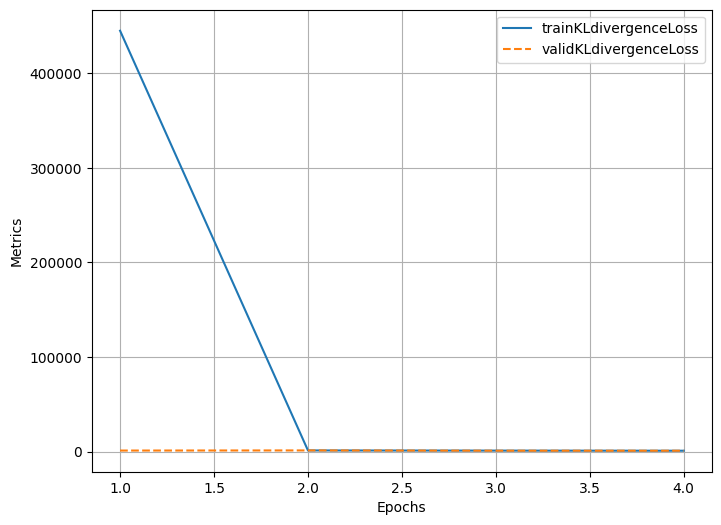

In [20]:
# plot the KL divergence loss
log.plot_epochs(['trainKLdivergenceLoss', 'validKLdivergenceLoss'])

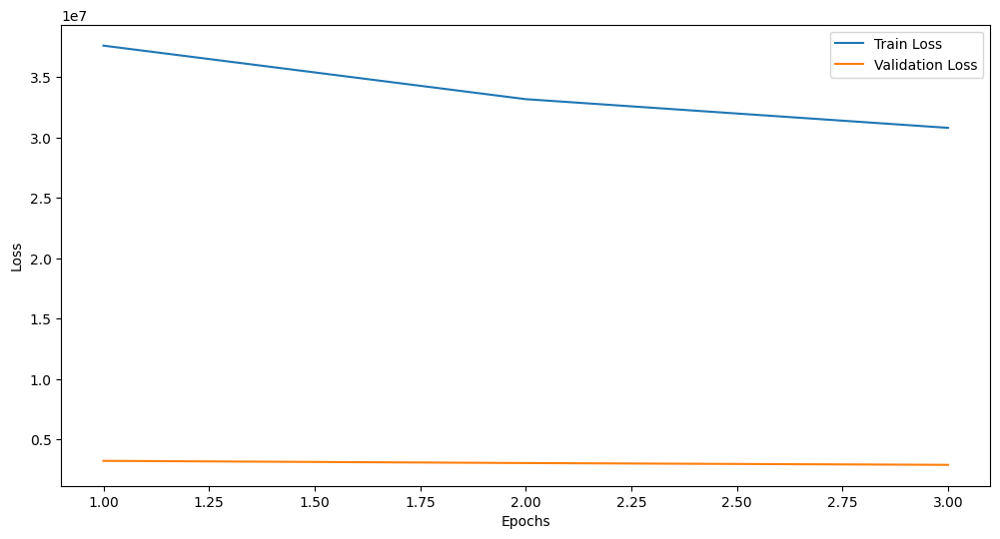

In [21]:
#plot the training and validation losses vs epochs
plt.figure(figsize=(12,6))
x_val = np.arange(1, numEpochs)

# plot from second epoch as the first epoch has a very high loss
plt.plot(x_val, trainLosses[1:], label='Train Loss')
plt.plot(x_val, validLosses[1:], label='Validation Loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.legend()
plt.show()




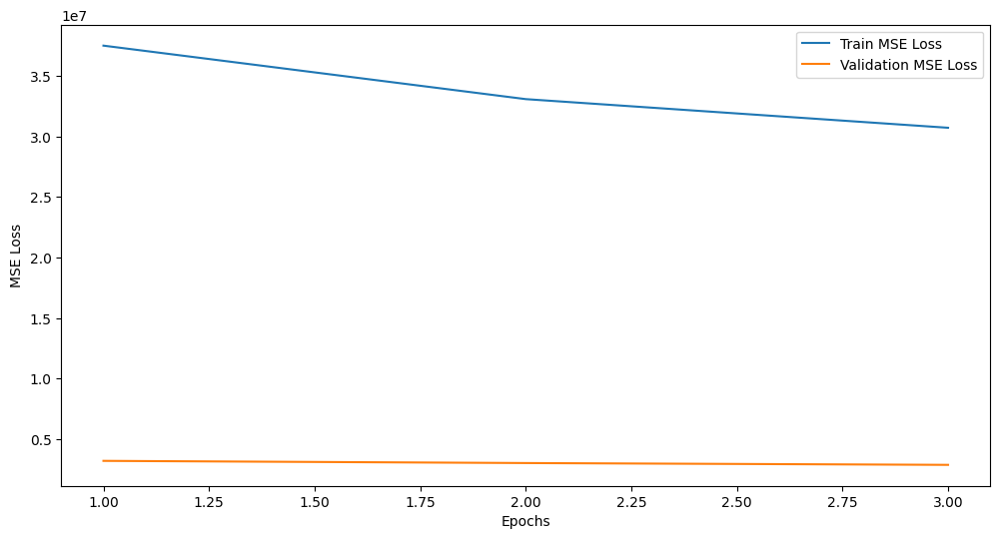

In [22]:
# plot the mse loss vs epochs

plt.figure(figsize=(12,6))
x_val = np.arange(1, numEpochs)

# plot from second epoch as the first epoch has a very high loss
plt.plot(x_val, trainMSELosses[1:], label='Train MSE Loss')
plt.plot(x_val, validMSELosses[1:], label='Validation MSE Loss')

plt.xlabel('Epochs')

plt.ylabel('MSE Loss')

plt.legend()
plt.show()


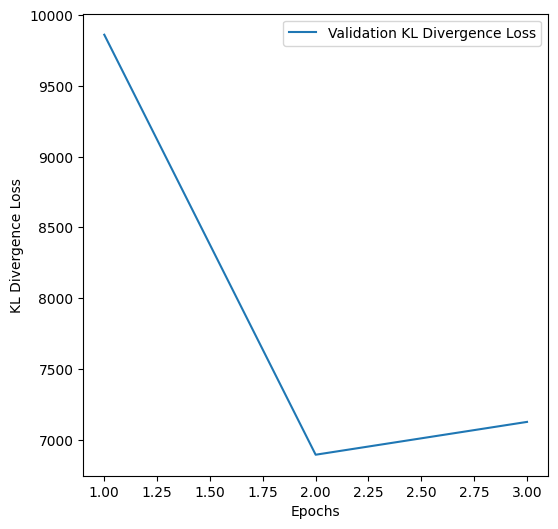

In [23]:
# Plot the KL Divergence Loss
plt.figure(figsize=(6,6))
x_val = np.arange(1, numEpochs)

# plot from second epoch as the first epoch has a very high loss
#plt.plot(x_val, trainKLDivergences[1:], label='Train KL Divergence Loss')
plt.plot(x_val, validKLDivergences[1:], label='Validation KL Divergence Loss')

plt.xlabel('Epochs')

plt.ylabel('KL Divergence Loss')

plt.legend()
plt.show()




In [26]:
# generate 100 images and save them to generateNew folder in current directory
# save each image as individual image in png format
with torch.no_grad():
    z = torch.randn(2000, 128).to(device)
    newImageSet = model.decoder(z)
    newImageSet = newImageSet.cpu()
    for i in range(2000):
        
        # save to generateNew folder
        save_image(newImageSet[i], f'generateNew/image_{i}.png')